# Project 7: Working with Personal Data

Jackson Wurzer and Achieng Kuir






Jackson's Work:

# Part 1: Extracting timestamps from your personal data


In [ ]:
# Import standard packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# STEP ONE: Import the data file

saved_jobs = pd.read_csv("/content/drive/MyDrive/CS215/Data/Saved Jobs.csv")

# STEP 1.5: Examine your data!
# How is it structured?
# What is in there?

saved_jobs.describe()

,Saved Date,Job Url,Job Title,Company Name
count,52,52,51,51
unique,51,52,47,43
top,"2/7/25, 11:00 AM",http://www.linkedin.com/jobs/view/4005490246,Financial Analyst,Barclays
freq,2,1,2,3


In [ ]:
# Renaming column to 'ts' for timestamp to align with Achieng's data
saved_jobs.rename(columns={'Saved Date': 'ts'}, inplace=True)
saved_jobs['ts'] = pd.to_datetime(saved_jobs['ts'], format='%m/%d/%y, %I:%M %p')
timestamps_df_j = saved_jobs['ts'].copy()

In [ ]:
from google.colab import files

timestamps_df_j.to_csv("timestamps_jackson.csv", index=False)
files.download('timestamps_jackson.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Part 2: Analyzing timestamp data for patterns

In [ ]:
# Import partner's data
timestamps_df_a = saved_jobs = pd.read_csv("/content/drive/MyDrive/CS215/Data/timestamps_achieng.csv")
timestamps_df_a.describe() # 11585 different timestamps

,ts
count,11585
unique,11568
top,2024-03-12T21:02:10Z
freq,5


1.

In [ ]:
# Convert to date time format
timestamps_df_a['ts'] = pd.to_datetime(timestamps_df_a['ts'], errors='coerce')

2. Sort and find time between rows

In [ ]:
timestamps_df_a = timestamps_df_a.sort_values(by='ts').reset_index(drop=True)
timestamps_df_a['Time Since Last'] = timestamps_df_a['ts'].diff()
timestamps_df_a.head()

,ts,Time Since Last
0,2024-01-09 15:29:14+00:00,NaT
1,2024-01-09 15:32:04+00:00,0 days 00:02:50
2,2024-01-09 15:32:37+00:00,0 days 00:00:33
3,2024-01-09 15:33:01+00:00,0 days 00:00:24
4,2024-01-09 15:39:17+00:00,0 days 00:06:16


3.

In [ ]:
longest_gap = timestamps_df_a['Time Since Last'].max()
average_gap = timestamps_df_a['Time Since Last'].mean()
average_gap_rounded = average_gap.round('s') # rounding the average to the nearest second
print("The longest amount of time between timestamps is: ", longest_gap)
print("The average amount of time between timestamps is: ", average_gap_rounded)

The longest amount of time between timestamps is:  10 days 05:25:08
The average amount of time between timestamps is:  0 days 00:53:00


4.

In [ ]:
# Extract the full date (year-month-day) using .dt.date
timestamps_df_a['Day'] = pd.DatetimeIndex(timestamps_df_a['ts']).date
day_counts = timestamps_df_a['Day'].value_counts()
most_common_day = day_counts.idxmax()
day_count = day_counts.max()
print("The day with the most timestamps is:", most_common_day, "with", day_count, "timestamps")

The day with the most timestamps is: 2025-01-27 with 781 timestamps


5.

In [ ]:
timestamps_df_a['Month'] = pd.DatetimeIndex(timestamps_df_a['ts']).month
timestamps_df_a['Month Name'] = timestamps_df_a['ts'].dt.month_name()
most_common_month = timestamps_df_a['Month Name'].value_counts().idxmax()
month_counts = timestamps_df_a['Month'].value_counts()
month_count = month_counts.max()
print("The month with the most timestamps is:", most_common_month, "with", month_count, "timestamps")

The month with the most timestamps is: February with 1608 timestamps


6.

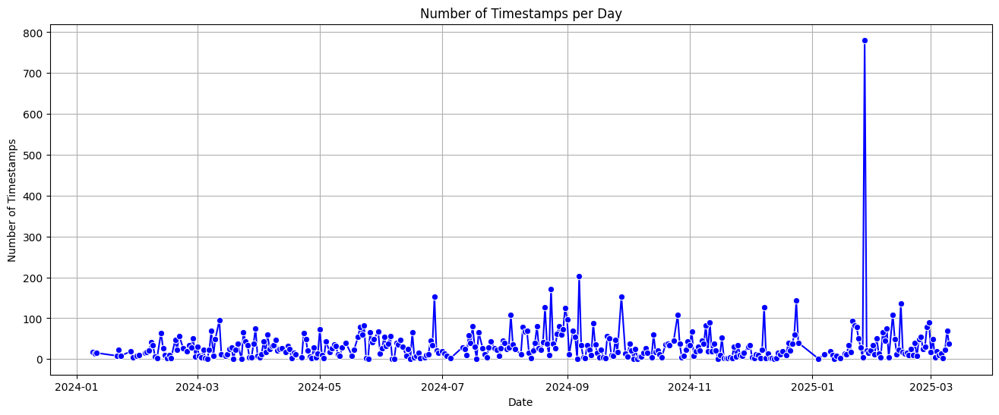

In [ ]:
timestamps_df_a['Date'] = timestamps_df_a['ts'].dt.date

# Count timestamps per day
day_counts = timestamps_df_a['Date'].value_counts().sort_index()

# Plot
plt.figure(figsize=(16, 6))
sns.lineplot(x=day_counts.index, y=day_counts.values, marker="o", color="blue")

plt.title("Number of Timestamps per Day")
plt.xlabel("Date")
plt.ylabel("Number of Timestamps")
plt.grid(True)
plt.show()

7. I think the source of the data may be coming from a social media platform like Instagram or TikTok. I say this because the average number of timestamps per day is fairly high and it could be reflecting the interaction with posts or videos or something like this. It would not be uncommon to be interacting with ~50 posts a day, the only data point that seems a little more unlikeley here is the date of January 27th where there were 781 timestamps. This makes me doubt that this data could be coming from a social media platform. I think really any additional data would be useful, maybe location data or IP data could be useful to help me verify if I am correct.

8. My partner's analysis seems mostly accurate. She almost guesses the correct data source but not quite. My data came from my the "Saved Jobs" list in LinkedIn and it records the time I saved each job.  

9. I think data for other social media platforms like YouTube or Instagram might actually be helpful because it's possible that when these platforms are used more, Spotify is used less (Spotify was the data source for Achieng). Maybe on days or months (like February) where there are more data points, there would be less timestamps from data from other social media platforms.

# Part 4: Analyze and visualize an additional element from  your personal data

Skipping to part 4 to keep my work (Jackson) all in the same place. Below this will be part 3, where we wrote joint code, and Achieng's parts 1, 2 and 4.

From my 'Saved Jobs' data from LinkedIn I'm curious:

1. Which companies have I most frequetly saved jobs from on LinkedIn?

2. What are the most common words that are in the 'Job Title' of the jobs I save? (i.e. 'Analyst', 'Financial', etc.)

I will first import my data and then use value counts to get the number of times each company shows up. Then I will convert the data to a data frame so I can plot. I decided to just look at the 10 most common companies on my Saved Jobs page.

<ipython-input-139-dab4b9955148>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='count', y='Company Name', data=company_counts_df.head(10), palette='viridis')


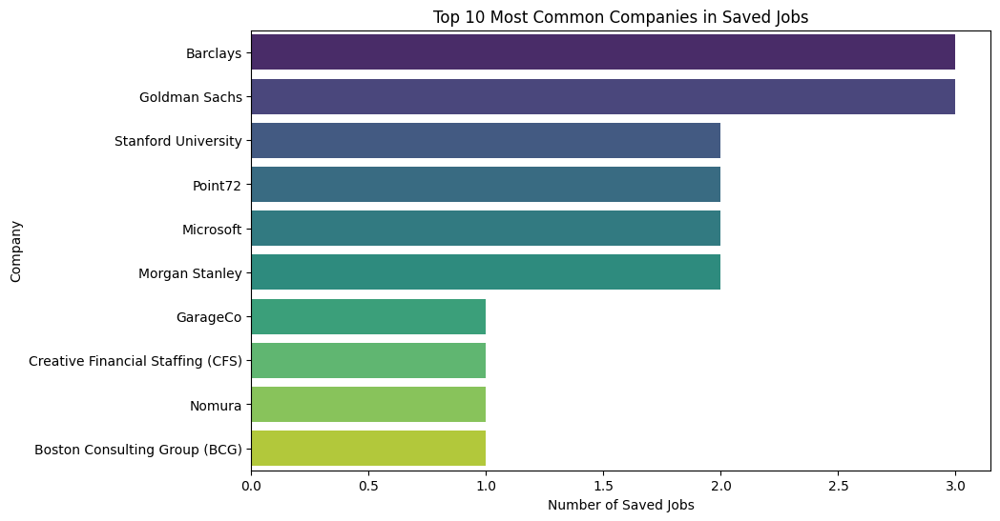

In [ ]:
saved_jobs = pd.read_csv("/content/drive/MyDrive/CS215/Data/Saved Jobs.csv") # reading in 'Saved Jobs' csv
company_counts = saved_jobs['Company Name'].value_counts()
company_counts_df = company_counts.reset_index()


plt.figure(figsize=(10,6))
sns.barplot(x='count', y='Company Name', data=company_counts_df.head(10), palette='viridis')
plt.title('Top 10 Most Common Companies in Saved Jobs')
plt.xlabel('Number of Saved Jobs')
plt.ylabel('Company')
plt.show()

It looks like I have some variety in the companies that I save jobs from. The most jobs I've saved from a single company is 3, which I have done for both Barclays and Goldman Sachs. A lot of the companies seem to be finance, academic, or technology-oriented.

Next I want to find the most common words that are in the job titles of the jobs I have saved. I will do this using Counter, by splitting the 'Job Title' column and flattening and then counting the most common words. I decided to look at the 7 most common words.

In [ ]:
from collections import Counter

# split job title
job_titles = saved_jobs['Job Title'].dropna().str.split()

# Flatten the list of words and count the occurrences
all_words = [word for title in job_titles for word in title]
word_counts = Counter(all_words)

most_common_words = word_counts.most_common(7)
print(most_common_words)

[('Analyst', 27), ('Research', 14), ('-', 13), ('Analyst,', 8), ('Quantitative', 8), ('Finance', 7), ('Investment', 7)]


'Analyst' is the most common word with 27 ocurrences, and 'Research' is second. '-' (a dash) is being counted as a word and shows up as the third most common. 'Analyst,' shows up again but this time with a comma after the word analyst. In total there are 35 ocurrences of the word Analyst. 'Quantitative' and 'Finance' show up 8 and 7 times respectively. This is interesting to see because it captures the job areas I am interested in. Most of these jobs are in the finance realm, so it makes sense that analyst is in the job title a lot because most jobs out of college are analyst positions. I might want to look at this data again when I'm older and see if things change, especially because I know now I likely won't go into the finance world.

# Part 3: Make a combined visualization

Both of us contributed to this part

In [ ]:
# Achieng's data
a_daily = timestamps_df_a['ts'].dt.date.value_counts().rename_axis('date').reset_index(name='count')
a_daily['person'] = 'Achieng'

# Jackson's data — NOTE: timestamps_df_j is likely just a Series, so no ['ts'] access here
j_daily = timestamps_df_j.dt.date.value_counts().rename_axis('date').reset_index(name='count')
j_daily['person'] = 'Jackson'

In [ ]:
# Combine into a single DataFrame using pd.concat
combined_daily = pd.concat([j_daily, a_daily])
combined_daily['date'] = pd.to_datetime(combined_daily['date'])

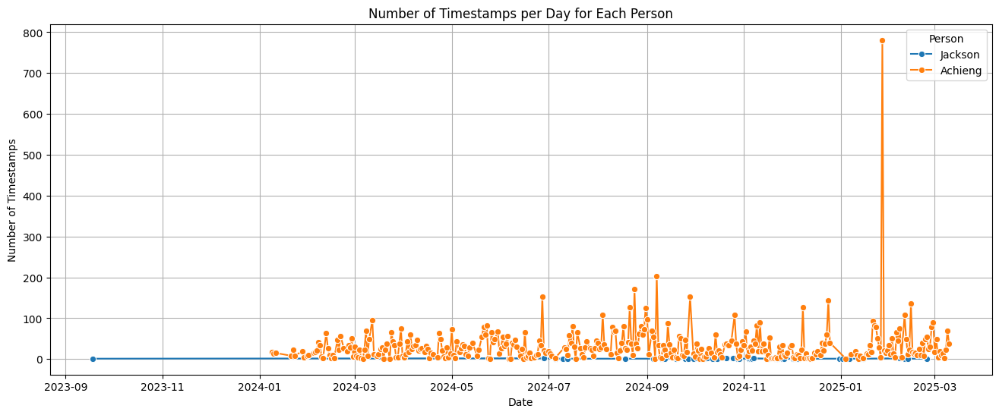

In [ ]:
plt.figure(figsize=(16, 6))
sns.lineplot(data=combined_daily, x='date', y='count', hue='person', marker='o')

plt.title("Number of Timestamps per Day for Each Person")
plt.xlabel("Date")
plt.ylabel("Number of Timestamps")
plt.legend(title='Person')
plt.grid(True)
plt.show()

As you can probably tell that Achieng has way more timestamps from her data source than Jackson has. Jackson's data dates back to the end of September, 2023, while Achieng's data begins in January, 2024. Achieng has many more timestamps per day also, with the most being 781 at the end of January. The most timestamps Jackson has for a day is 3, which is hard to distinguish from 0 on this graph.  

#Part 1: Extracting timestamps from your personal data

Achieng's work from part 1, 2 and 4

In [ ]:
# Import standard packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# STEP ONE: Import the data file

# STEP 1.5: Examine your data!
# How is it structured?
# STEP ONE: Import the data file

# STEP 1.5: Examine your data!
# How is it structured?
# What is in there?

from google.colab import files
uploaded = files.upload()

Saving Streaming_History_Audio_2024-2025.json to Streaming_History_Audio_2024-2025 (1).json


In [ ]:
import json

In [ ]:
with open('Streaming_History_Audio_2024-2025 (1).json', 'r') as file:
    data = json.load(file)

In [ ]:
print(data)

[{'ts': '2024-01-09T15:29:14Z', 'platform': 'android', 'ms_played': 184613, 'conn_country': 'US', 'ip_addr': '108.92.144.125', 'master_metadata_track_name': 'Under The Influence', 'master_metadata_album_artist_name': 'Chris Brown', 'master_metadata_album_album_name': 'Indigo (Extended)', 'spotify_track_uri': 'spotify:track:5IgjP7X4th6nMNDh4akUHb', 'episode_name': None, 'episode_show_name': None, 'spotify_episode_uri': None, 'audiobook_title': None, 'audiobook_uri': None, 'audiobook_chapter_uri': None, 'audiobook_chapter_title': None, 'reason_start': 'playbtn', 'reason_end': 'trackdone', 'shuffle': False, 'skipped': False, 'offline': False, 'offline_timestamp': 1704813970, 'incognito_mode': False}, {'ts': '2024-01-09T15:32:04Z', 'platform': 'android', 'ms_played': 169911, 'conn_country': 'US', 'ip_addr': '108.92.144.125', 'master_metadata_track_name': 'UNAVAILABLE (feat. Musa Keys)', 'master_metadata_album_artist_name': 'Davido', 'master_metadata_album_album_name': 'Timeless', 'spotify_

In [ ]:
df = pd.DataFrame(data)

In [ ]:
df.head()

,ts,platform,ms_played,conn_country,ip_addr,master_metadata_track_name,master_metadata_album_artist_name,master_metadata_album_album_name,spotify_track_uri,episode_name,...,audiobook_uri,audiobook_chapter_uri,audiobook_chapter_title,reason_start,reason_end,shuffle,skipped,offline,offline_timestamp,incognito_mode
0,2024-01-09T15:29:14Z,android,184613,US,108.92.144.125,Under The Influence,Chris Brown,Indigo (Extended),spotify:track:5IgjP7X4th6nMNDh4akUHb,None,...,None,None,None,playbtn,trackdone,False,False,False,1704813970,False
1,2024-01-09T15:32:04Z,android,169911,US,108.92.144.125,UNAVAILABLE (feat. Musa Keys),Davido,Timeless,spotify:track:2kaH2Z8ezDUKf6fNw250rZ,None,...,None,None,None,trackdone,trackdone,False,False,False,1704814154,False
2,2024-01-09T15:32:37Z,android,31705,US,108.92.144.125,City Boys,Burna Boy,I Told Them...,spotify:track:4RoKNqyZ9622tcAeNPNv5k,None,...,None,None,None,trackdone,backbtn,False,True,False,1704814325,False
3,2024-01-09T15:33:01Z,android,23222,US,108.92.144.125,UNAVAILABLE (feat. Musa Keys),Davido,Timeless,spotify:track:2kaH2Z8ezDUKf6fNw250rZ,None,...,None,None,None,backbtn,endplay,False,True,False,1704814358,False
4,2024-01-09T15:39:17Z,android,157714,US,108.92.144.125,Lonely At The Top,Asake,Work Of Art,spotify:track:5ZtK8XAVnoaGdBXZWCEVCY,None,...,None,None,None,clickrow,trackdone,False,False,False,1704814381,False


In [ ]:
# STEP TWO: Extract just the timestamps and save them as a dataframe
timestamps_df = df[['ts']]

In [ ]:
timestamps_df.head(25)

,ts
0,2024-01-09T15:29:14Z
1,2024-01-09T15:32:04Z
2,2024-01-09T15:32:37Z
3,2024-01-09T15:33:01Z
4,2024-01-09T15:39:17Z
5,2024-01-09T15:42:12Z
6,2024-01-09T15:45:11Z
7,2024-01-09T15:56:56Z
8,2024-01-09T17:31:47Z
9,2024-01-09T17:34:51Z


In [ ]:
# STEP THREE: Export that timestamps as a CSV file
# At the end, make sure you export your dataframe (containing timestamps) using .to_csv
# df.to_csv("filename.csv")

timestamps_df.to_csv("timestamps.csv", index=False)

#Part 2: Analyzing timestamp data for patterns

In [ ]:
# Import standard packages
import pandas as pd
import numpy as np

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving timestamps (1).csv to timestamps (1).csv


In [ ]:
df = pd.read_csv('timestamps (1).csv')

In [ ]:
df.head()

,Saved Date
0,"10/28/24, 11:36 AM"
1,"9/25/24, 4:31 PM"
2,"11/25/24, 9:01 PM"
3,"9/27/24, 3:55 PM"
4,"10/5/24, 3:55 AM"


In [ ]:
##Step 1
# Convert the 'Saved Date' column to datetime format
df['Saved Date'] = pd.to_datetime(df['Saved Date'], format='%m/%d/%y, %I:%M %p')

# Sort the dataframe by the 'Saved Date' column
df = df.sort_values(by='Saved Date')

df.head()

,Saved Date
46,2023-09-18 10:40:00
6,2024-06-28 11:19:00
31,2024-06-28 16:49:00
44,2024-07-05 20:32:00
48,2024-07-10 18:58:00


In [ ]:
##Step 2
# Calculate the time difference between consecutive timestamps and add it as a new column
df['Time Difference'] = df['Saved Date'].diff()

In [ ]:
df.head()

,Saved Date,Time Difference
46,2023-09-18 10:40:00,NaT
6,2024-06-28 11:19:00,284 days 00:39:00
31,2024-06-28 16:49:00,0 days 05:30:00
44,2024-07-05 20:32:00,7 days 03:43:00
48,2024-07-10 18:58:00,4 days 22:26:00


In [ ]:
##Step 3
# Calculate the longest and average time differences
longest_diff = df['Time Difference'].max()
average_diff = df['Time Difference'].mean()

longest_diff, average_diff

(Timedelta('284 days 00:39:00'), Timedelta('10 days 07:00:21.176470588'))

In [ ]:
##Step 4
# Extract the day from the 'Saved Date' column and create a new column 'days'
df['Day'] = pd.DatetimeIndex(df['Saved Date']).date

In [ ]:
# Count the number of timestamps for each day
day_counts = df['Day'].value_counts()

In [ ]:
# Get the day with the most timestamps and how many events occurred on that day
most_timestamps_day = day_counts.idxmax()
most_timestamps_day_count = day_counts.max()

most_timestamps_day, most_timestamps_day_count

(datetime.date(2024, 10, 25), 3)

In [ ]:
##Step 5
# Extract the month from the 'Saved Date' column and create a new column 'Month'
df['Month'] = pd.DatetimeIndex(df['Saved Date']).month


In [ ]:
# Count the number of timestamps for each month
month_counts = df['Month'].value_counts()

In [ ]:
# Get the month with the most timestamps and how many events occurred in that month
most_timestamps_month = month_counts.idxmax()
most_timestamps_month_count = month_counts.max()

most_timestamps_month, most_timestamps_month_count

(np.int32(10), 16)

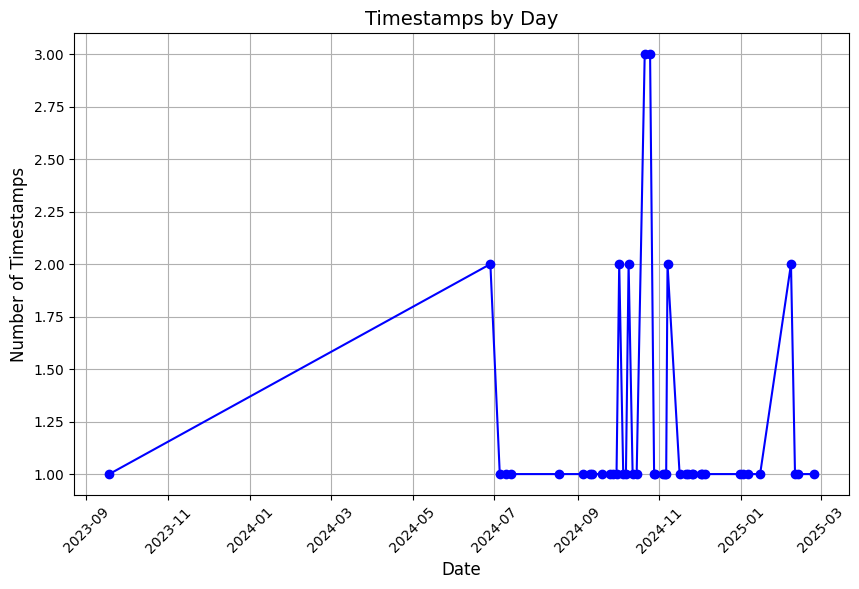

In [ ]:
##Step 6
import matplotlib.pyplot as plt

# Plot the number of timestamps by day
df['Day'] = pd.to_datetime(df['Day'])  # Ensure Day is in datetime format for plotting
day_counts = df['Day'].value_counts().sort_index()

# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(day_counts.index, day_counts.values, marker='o', linestyle='-', color='b')
plt.title('Timestamps by Day', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Number of Timestamps', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

#Interpretation
The plot above shows the number of timestamps by day. It visually represents the distribution of events over time, allowing one to observe trends and patterns.

7. Regarding the source of this data: based on the frequency of timestamps, I would speculate that this could be related to events like system logins(logging into a social media app). I think from 2023-09 that is when the first lognin was done and until 2024-07, then it became frequent after that. To verify this, additional data such as, user IDs, or categories could help clarify the context.

(Jackson's data was from LinkedIn saved jobs)

8. My partner did not guess the source of my data correctly. although he did mentioned something about social media login which could be arguably true due the patterns in my data. (My data was from Spotify streaming history)

9. This shows where most of the logins happened.(The month of October 2024 gives a lot of timestamps)

#Part 4: Analyze and visualize an additional element from your personal data

Two questions.

1. What are the most frequently played tracks in the dataset?

2. Which artist has the most played tracks in the dataset?


Data Manipulation and Calculations

For the first question: we can calculate the total playtime (ms_played) for each track and identify the most played ones.

For the second question: We could group the data by artist and count how many of their tracks appear frequently in the dataset.

In [ ]:
#Neccessary packages
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Streaming_History_Audio_2024-2025.json to Streaming_History_Audio_2024-2025.json


In [ ]:
import pandas as pd
import json

In [ ]:
with open('Streaming_History_Audio_2024-2025.json', 'r') as file:
    data = json.load(file)

In [ ]:
print(data)

[{'ts': '2024-01-09T15:29:14Z', 'platform': 'android', 'ms_played': 184613, 'conn_country': 'US', 'ip_addr': '108.92.144.125', 'master_metadata_track_name': 'Under The Influence', 'master_metadata_album_artist_name': 'Chris Brown', 'master_metadata_album_album_name': 'Indigo (Extended)', 'spotify_track_uri': 'spotify:track:5IgjP7X4th6nMNDh4akUHb', 'episode_name': None, 'episode_show_name': None, 'spotify_episode_uri': None, 'audiobook_title': None, 'audiobook_uri': None, 'audiobook_chapter_uri': None, 'audiobook_chapter_title': None, 'reason_start': 'playbtn', 'reason_end': 'trackdone', 'shuffle': False, 'skipped': False, 'offline': False, 'offline_timestamp': 1704813970, 'incognito_mode': False}, {'ts': '2024-01-09T15:32:04Z', 'platform': 'android', 'ms_played': 169911, 'conn_country': 'US', 'ip_addr': '108.92.144.125', 'master_metadata_track_name': 'UNAVAILABLE (feat. Musa Keys)', 'master_metadata_album_artist_name': 'Davido', 'master_metadata_album_album_name': 'Timeless', 'spotify_

In [ ]:
df = pd.DataFrame(data)

In [ ]:
#1 Calculate total playtime per track
track_playtime = df.groupby('master_metadata_track_name')['ms_played'].sum().reset_index()

# Sort by total playtime in descending order and get the top 10 most played tracks
top_tracks = track_playtime.sort_values(by='ms_played', ascending=False).head(10)

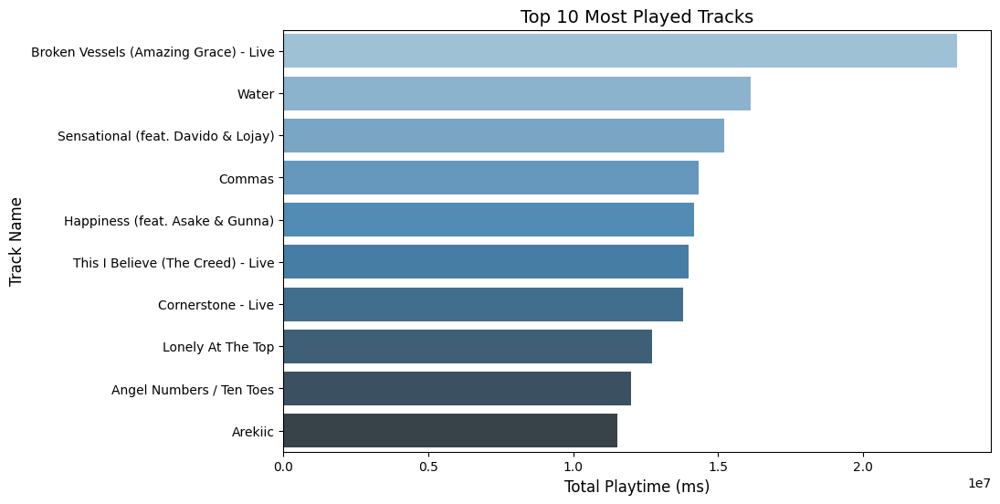

In [ ]:
# Visualization: Top 10 most played tracks
plt.figure(figsize=(10, 6))
sns.barplot(data=top_tracks, x='ms_played', y='master_metadata_track_name', hue='master_metadata_track_name', palette='Blues_d')
plt.title('Top 10 Most Played Tracks', fontsize=14)
plt.xlabel('Total Playtime (ms)', fontsize=12)
plt.ylabel('Track Name', fontsize=12)
plt.show()

#Interpretation:

The chart above shows my Top 10 Most Played Tracks based on total playtime in milliseconds. The track "Broken Vessels (Amazing Grace) - Live" has the highest total playtime, followed by "Water" and "Sensational (feat. Davido & Lojay)". The tracks range from well-known songs by popular artists to some less familiar titles.

In [ ]:
# 2 Group by artist and calculate total playtime (ms_played) for each artist
artist_playtime = df.groupby('master_metadata_album_artist_name')['ms_played'].sum().reset_index()

# Sort by total playtime in descending order to identify the most played artist
artist_playtime_sorted = artist_playtime.sort_values(by='ms_played', ascending=False)

# Get the artist with the most playtime
artist_with_most_playtime = artist_playtime_sorted.head(1)

artist_with_most_playtime

,master_metadata_album_artist_name,ms_played
263,Hillsong Worship,125484769


#Interpretation
The codes above shows the artist with the most played tracks I have play in the dataset is Hillsong Worship, with a total playtime of 125,484,769 milliseconds.
